## **Contents**
-  [Introduction](#i)
-  [1.Importing Libraries](#1)
-  [2.Helper Functions](#2)
-  [3.Dataset Managament](#3)
    -  [3.1.Initializing Dataset](#3.1)
    -  [3.2.Visualizing Dataset](#3.2)
    -  [3.3.Dataset and DataLoaders](#3.3)
-  [4.Initializing pre-trained model](#4)
-  [5.Training](#5)
-  [6.Plotting Graphs](#6)
    -  [6.1.Plotting Loss vs Epoch](#6.1)
-  [7.Loading](#7)
-  [8.Predictions](#8)

## **Introduction** <a class="anchor" id="i"></a>


In this notebook I am visualizing the dataset and also training [Faster R-CNN](https://arxiv.org/abs/1506.01497) model using [Pytorch](https://pytorch.org/) library. <br> 

&nbsp;&nbsp;&nbsp;&nbsp;Faster R-CNN is a deep convolutional network used for object detection, that appears to the user as a single, end-to-end, unified network. The network can accurately and quickly predict the locations of different objects.<br><br>
The architecture of Faster R-CNN is shown in the next figure. It consists of 2 modules:<br>
&nbsp;&nbsp;&nbsp;&nbsp;- RPN: For generating region proposals.<br>
&nbsp;&nbsp;&nbsp;&nbsp;- Fast R-CNN: For detecting objects in the proposed regions.<br>

<img src= "https://techcommunity.microsoft.com/t5/image/serverpage/image-id/96463i31DC36F85ABB1963"  style='width: 600px;'>

<br>Read more about Faster R-CNN [here](https://blog.paperspace.com/faster-r-cnn-explained-object-detection/)


### **1.Importing Libraries** <a class="anchor" id="1"></a>

In [1]:

import os
import cv2
import json
import torch
import numpy as np
import torchvision
import seaborn as sns
import albumentations as A
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset
from albumentations.pytorch.transforms import ToTensorV2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

torch.cuda.empty_cache()
np.random.seed(0)
torch.manual_seed(0)

sns.set_style("darkgrid")

### **2.Helper Functions** <a class="anchor" id="2"></a>

In [2]:
# Albumentations
def get_train_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def collate_fn(batch):
    return tuple(zip(*batch))

### **3.Dataset Managament** <a class="anchor" id="3"></a>

#### 1.Initalizing Dataset <a class="anchor" id="3.1"></a>

In [3]:
TRAIN_IMAGE_PATH = 'dataset/training_data/images/'
TRAIN_ANNOTATION_PATH = 'dataset/training_data/annotations/'
TEST_IMAGE_PATH = 'dataset/testing_data/images/'
TEST_ANNOTATION_PATH = 'dataset/testing_data/annotations/'

train_images_path = np.char.add(TRAIN_IMAGE_PATH,np.array(os.listdir(TRAIN_IMAGE_PATH)))
train_annotation_path = np.char.add(TRAIN_ANNOTATION_PATH,np.array(os.listdir(TRAIN_ANNOTATION_PATH)))

test_images_path = np.char.add(TEST_IMAGE_PATH,np.array(os.listdir(TEST_IMAGE_PATH)))
test_annotation_path = np.char.add(TEST_ANNOTATION_PATH,np.array(os.listdir(TEST_ANNOTATION_PATH)))

print(f'Number of Train Images : {len(train_images_path)}')
print(f'Number of Test Images : {len(test_annotation_path)}')

Number of Train Images : 149
Number of Test Images : 50


#### 2.Visualizing Dataset <a class="anchor" id="3.2"></a>

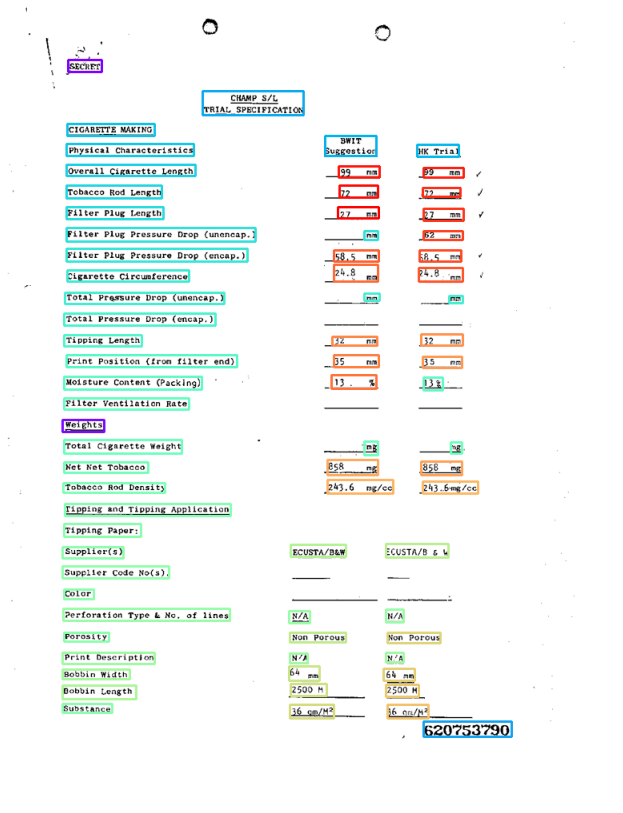

In [4]:
n = 10
thickness = 2
img = cv2.imread(train_images_path[n])

plt.figure(figsize=(50,50))

form = json.load(open(train_annotation_path[n]))['form']
colors = cm.rainbow(np.linspace(0, 1, len(form)))

color_code = {}
for box, color in zip(form, colors):
    id = box['id']
    link = box['linking']
    if len(link) != 0:
        for linked_id in link:
            color_code[linked_id[1]] = color
    color_code[id] = color

for i in form:
    color = (255, 0, 0, 0)
    
    bounding_vertex = tuple(i['box'])
    x_min, y_min, x_max, y_max = bounding_vertex
    img = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color_code[i['id']][:-1]*255, thickness )

plt.subplot(3, 2, 1)
plt.axis('off')
plt.imshow(img)

In [5]:
for i in json.load(open(train_annotation_path[n]))['form']:
    print(i['label'],i['text'])

other SECRET
header Weights
question Supplier(s)
question Color
question Porosity
question Substance
answer mm
answer mm
answer mm
answer 13%
answer mg
answer mg
answer N/A
answer N/A
answer N/A
answer N/A
other 620753790
header CHAMP S/ L TRIAL SPECIFICATION
question BWIT Suggestion
question HK Trial
header CIGARETTE MAKING
header Physical Characteristics
question Overall Cigarette Length
question Tobacco Rod Length
question Filter Plug Length
question Filter Plug Pressure Drop (unencap.)
question Filter Plug Pressure Drop (encap.)
question Cigarette Circumference
question Total Pressure Drop (unencap.)
question Total Pressure Drop (encap.)
question Tipping Length
question Print Position (from filter end)
question Moisture content (Packing)
question Filter Ventilation Rate
question Total Cigarette Weight
question Net Net Tobacco
question Tobacco Rod Density
header Tipping and Tipping Application
header Tipping Paper:
question Supplier Code No(s).
question Perforation Type & No. of lin

In [6]:
classes = []
for box in json.load(open(train_annotation_path[0]))['form']:
    if box['label'] not in classes:
        classes.append(box['label'])

print(classes)

['other', 'question', 'answer', 'header']


#### 3.Datasets and DataLoaders <a class="anchor" id="3.3"></a>

In [7]:
class ocr_dataset(Dataset):

    def __init__(self, img_path, annotations_path,classes, transforms=None):
        super().__init__()
        self.x_path = img_path
        self.y_path = annotations_path
        self.transforms = transforms
        self.classes = classes

    def __getitem__(self, index):
        image = cv2.imread(self.x_path[index], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0

        boxes = []
        area = []
        label = []
        for i in json.load(open(self.y_path[index],encoding="utf8"))['form']:
            boxes.append(i['box'])
            x_min, y_min, x_max, y_max = tuple(boxes[-1])
            area.append((x_max-x_min)*(y_max-y_min))
            label.append(self.classes.index(i['label'])+1)
        
        area = torch.as_tensor(area, dtype=torch.float32)
        label = torch.tensor(label,dtype=torch.int64)
        # suppose all instances are not crowd
        iscrowd = torch.zeros((label.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = label
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd

        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': label
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)

        return image, target

    def __len__(self):
        return len(self.x_path)


In [8]:
train_dataset = ocr_dataset(train_images_path,train_annotation_path,classes,get_train_transform())
test_dataset = ocr_dataset(test_images_path,test_annotation_path,classes,get_train_transform())

# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()

train_data_loader = DataLoader(
    train_dataset,
    batch_size=3,
    shuffle=True,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    collate_fn=collate_fn
)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

print(train_data_loader.__len__())


50


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 753.5, 999.5, -0.5)

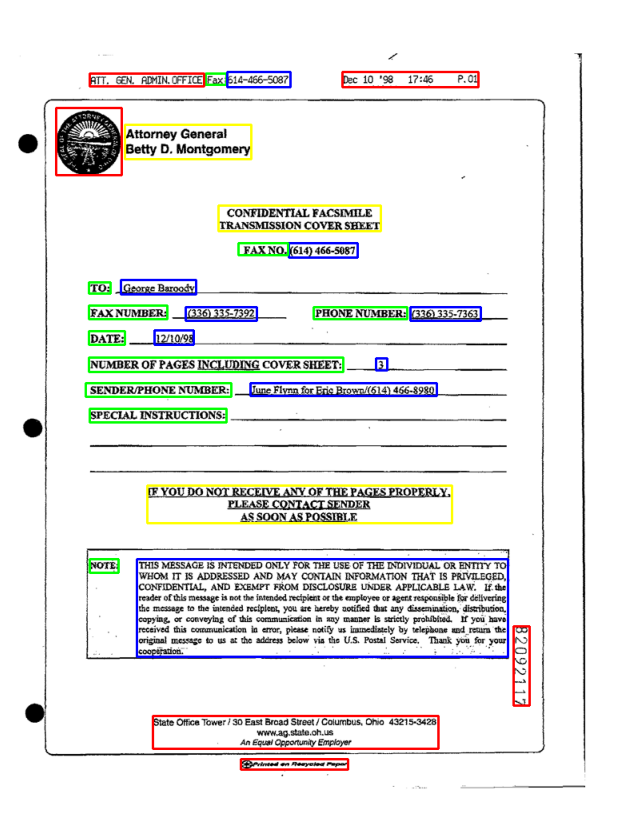

In [9]:
images, targets = next(iter(valid_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
boxes = targets[0]['boxes'].cpu().numpy().astype(np.int32)
labels = targets[0]['labels'].cpu().numpy().astype(np.int32)
sample = images[0].permute(1,2,0).cpu().numpy()

colors = cm.rainbow(np.linspace(0, 1, 4))
color_code = {0:(0,255,255),1:(255,0,0),2:(0,255,0),3:(0,0,255),4:(255,255,0)}

plt.figure(figsize=(50,50))
for box,label_n in zip(boxes,labels):
    cv2.rectangle(sample,
                  (box[0], box[1]),
                  (box[2], box[3]),color_code[label_n],2)
plt.subplot(3, 2, 1)
plt.imshow(sample)
plt.axis('off')


### **4.Initializing pre-trained model** <a class="anchor" id="4"></a>

In [10]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = len(classes)+1  # 1 class (wheat) + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [11]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

### **5.Training** <a class="anchor" id="5"></a>

In [12]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
torch.cuda.empty_cache()
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

epoch = 50
loss_history = [[],[]]
train_n_minibatches = train_data_loader.__len__()
validation_n_minibatches = valid_data_loader.__len__()
model.train()
log_idx = train_n_minibatches//4
best_test_loss = 1000000

for e in range(epoch):
    for batch_idx , (x ,y) in enumerate(train_data_loader):
        torch.cuda.empty_cache()
        optimizer.zero_grad()
        x = list(image.to(device) for image in x)
        y = [{k: v.to(device) for k, v in t.items()} for t in y]
        loss_dict = model(x, y)
        
        loss = sum(loss for loss in loss_dict.values())
        loss.backward()
        optimizer.step()
        loss_history[0].append(float(loss.detach().cpu().numpy()))
        
        if batch_idx % log_idx == 0:
            # Printing Log
            print(f'LOSS for EPOCH {e+1} BATCH {batch_idx+1}/{train_n_minibatches} TRAIN LOSS : {loss_history[0][-1]}',end = ' ')
            with torch.no_grad():
                # Calculating loss and accuracy for validation
                for _batch_idx_ , (x ,y) in enumerate(valid_data_loader):
                    x = list(image.to(device) for image in x)
                    y = [{k: v.to(device) for k, v in t.items()} for t in y]
                    loss_dict = model(x, y)
                    validation_loss = sum(loss for loss in loss_dict.values())
                    loss_history[1].append(float(validation_loss.detach().cpu().numpy()))
                                      
                print(f'VALIDATION LOSS : {sum(loss_history[1][-1:-validation_n_minibatches-1:-1])/validation_n_minibatches}')

    n_validation_losses = int(train_n_minibatches/log_idx)*validation_n_minibatches
    avg_valid_loss = sum(loss_history[1][-1:-1*n_validation_losses-1:-1])/n_validation_losses

    if avg_valid_loss<best_test_loss:
        torch.save(model.state_dict(),f'saved_models/{avg_valid_loss}_faster_rcnn_sgd_0.01')
        best_test_loss=avg_valid_loss

    #Log for e+1th epoch
    print(f'---------------------------------------EPOCH {e+1}-------------------------------------------')
    print(f'Loss for EPOCH {e+1}  TRAIN LOSS : {sum(loss_history[0][-1:-train_n_minibatches-1:-1])/train_n_minibatches}')
    print(f'VALIDATION LOSS for EPOCH {e+1} : {avg_valid_loss}',end = '\n')
    print('---------------------------------------------------------------------------------------------')

C:\Python\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


LOSS for EPOCH 1 BATCH 1/50 TRAIN LOSS : 9.122109282470356 VALIDATION LOSS : 4.205599900907655
LOSS for EPOCH 1 BATCH 13/50 TRAIN LOSS : 1.5321029050660142 VALIDATION LOSS : 1.814089817984348
LOSS for EPOCH 1 BATCH 25/50 TRAIN LOSS : 1.6143654896293484 VALIDATION LOSS : 1.703294361693064
LOSS for EPOCH 1 BATCH 37/50 TRAIN LOSS : 1.5949988342473262 VALIDATION LOSS : 1.5899972203036978
LOSS for EPOCH 1 BATCH 49/50 TRAIN LOSS : 1.3922904837629713 VALIDATION LOSS : 1.5607010403998853
---------------------------------------EPOCH 1-------------------------------------------
Loss for EPOCH 1  TRAIN LOSS : 1.9574267154925147
VALIDATION LOSS for EPOCH 1 : 1.667020610095249
---------------------------------------------------------------------------------------------
LOSS for EPOCH 2 BATCH 1/50 TRAIN LOSS : 1.6270830062553876 VALIDATION LOSS : 1.5541869696851367
LOSS for EPOCH 2 BATCH 13/50 TRAIN LOSS : 1.4749149639455066 VALIDATION LOSS : 1.4888034302560742
LOSS for EPOCH 2 BATCH 25/50 TRAIN LOS

### **6.Plotting Graphs** <a class="anchor" id="6"></a>

#### 1.Plotting Loss vs Epoch<a class="anchor" id="6.1"></a>

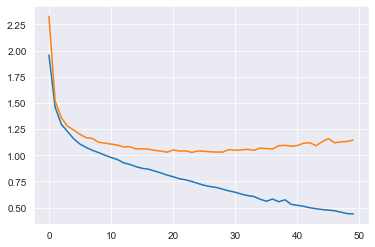

In [13]:
loss_per_epoch = [[],[]]
for i in range(epoch):
    temp = 0
    for j in loss_history[0][i*train_n_minibatches:(i+1)*train_n_minibatches]:
        temp = temp + j
    loss_per_epoch[0].append(temp/train_n_minibatches)
    temp = 0
    for j in loss_history[1][i*n_validation_losses:(i+1)*n_validation_losses]:
        temp = temp + j
    loss_per_epoch[1].append(temp/n_validation_losses)    

sns.lineplot(x=range(len(loss_per_epoch[0])),y=loss_per_epoch[0])
sns.lineplot(x=range(len(loss_per_epoch[1])),y=loss_per_epoch[1])
plt.show()


### **7.Loading**<a class="anchor" id="7"></a>

In [14]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = len(classes)+1  # 1 class (wheat) + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model.load_state_dict(torch.load(f'saved_models/{best_test_loss}_masked_rcnn_sgd_0.01'))

<All keys matched successfully>

### **8.Predictions**<a class="anchor" id="8"></a>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


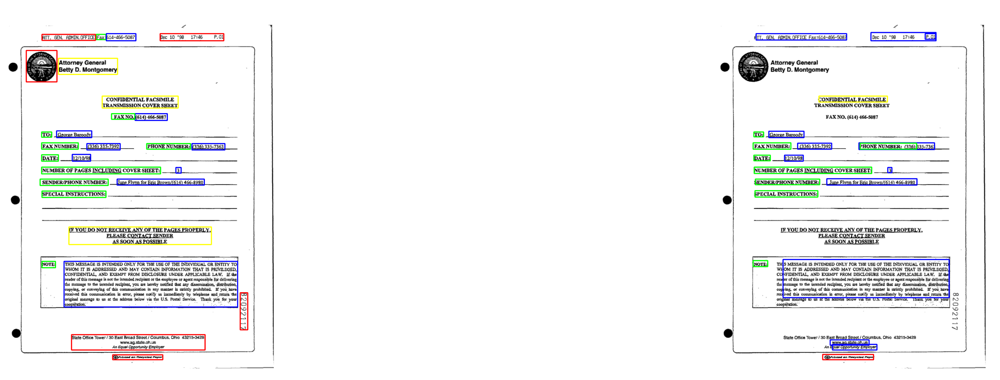

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


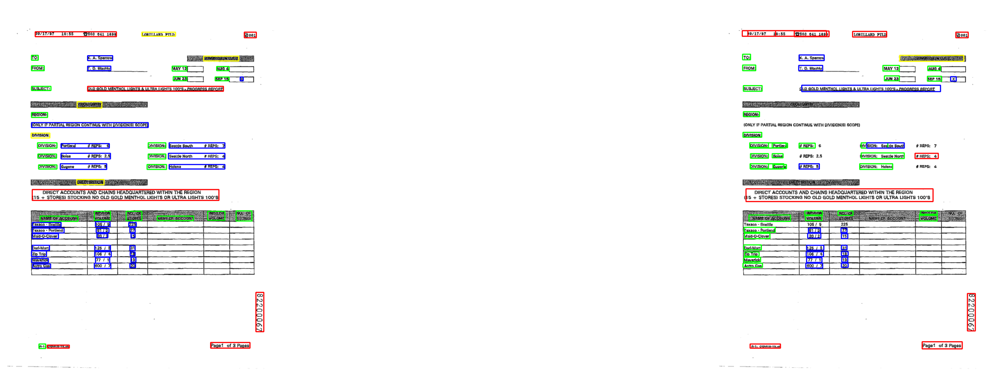

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


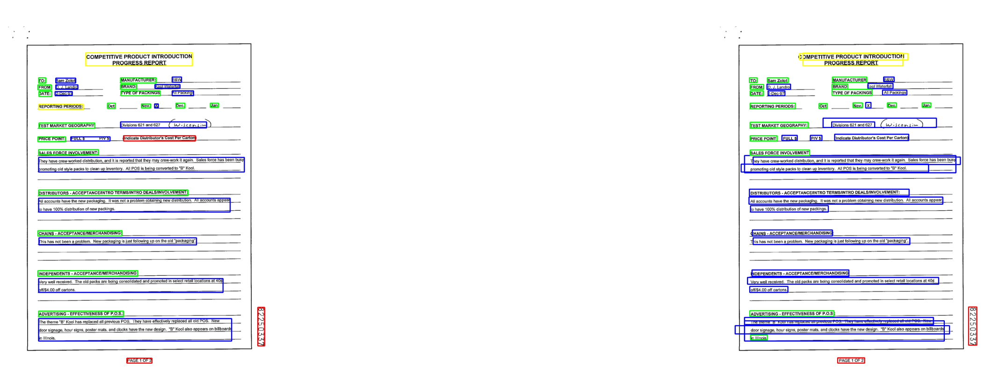

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


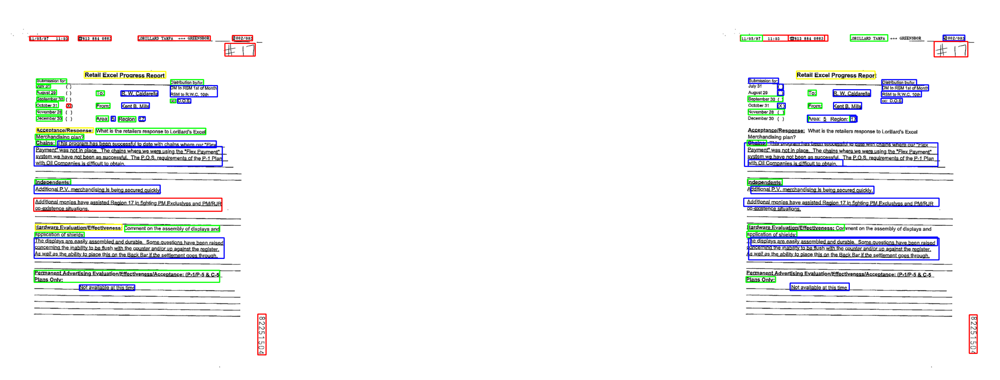

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


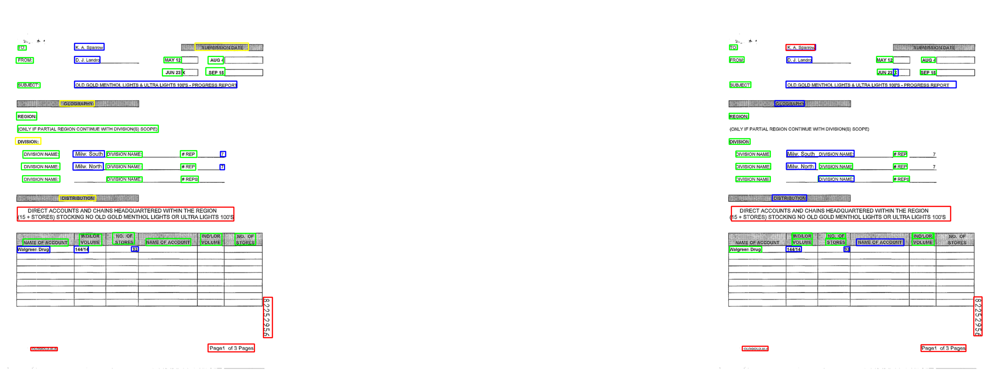

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


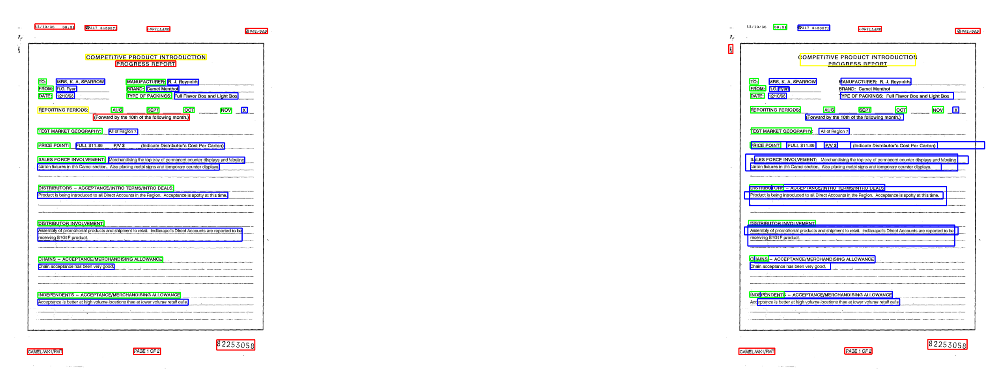

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


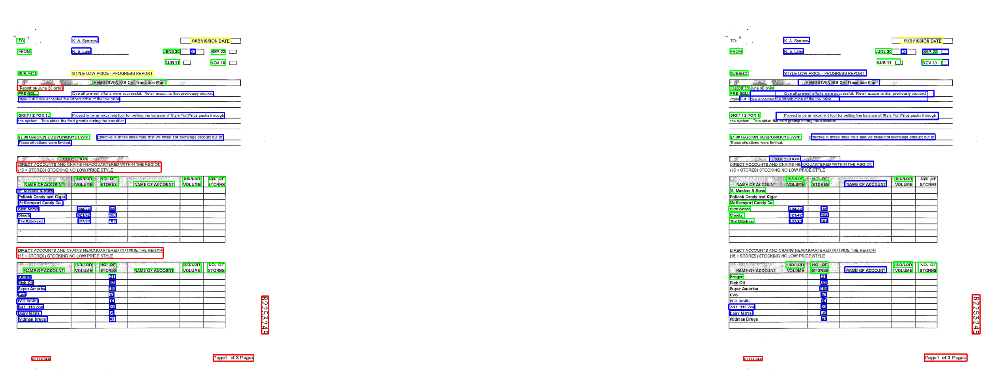

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


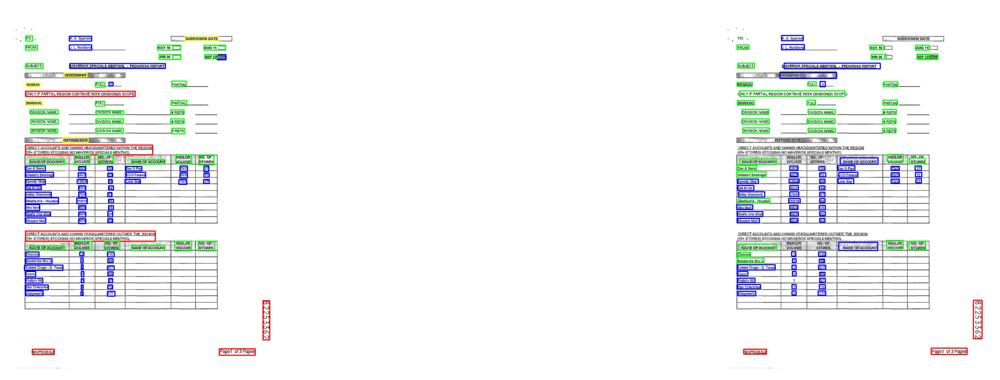

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


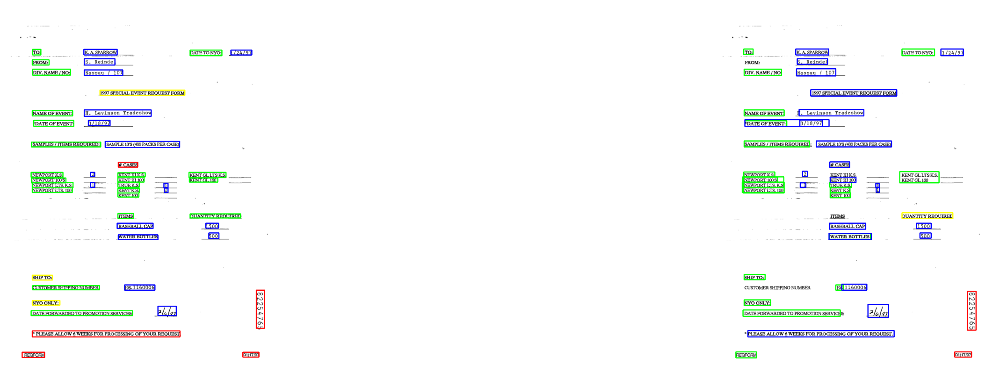

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


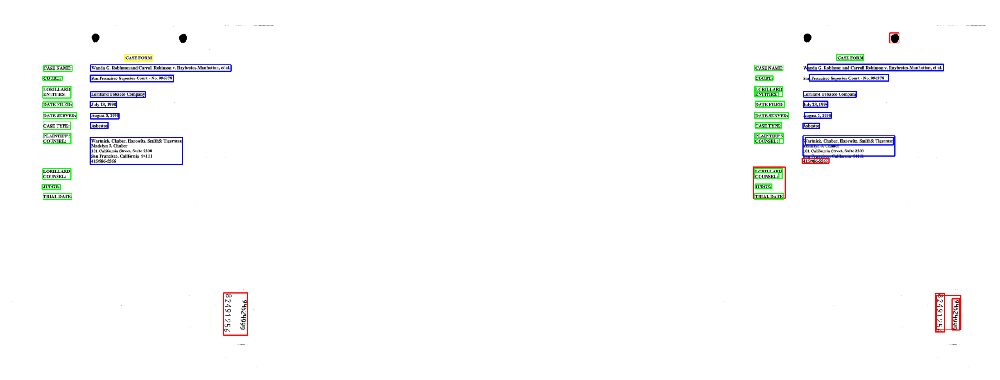

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


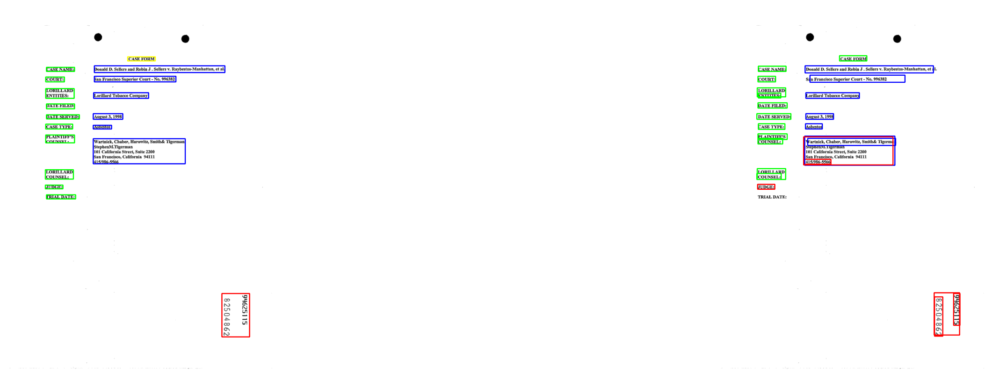

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


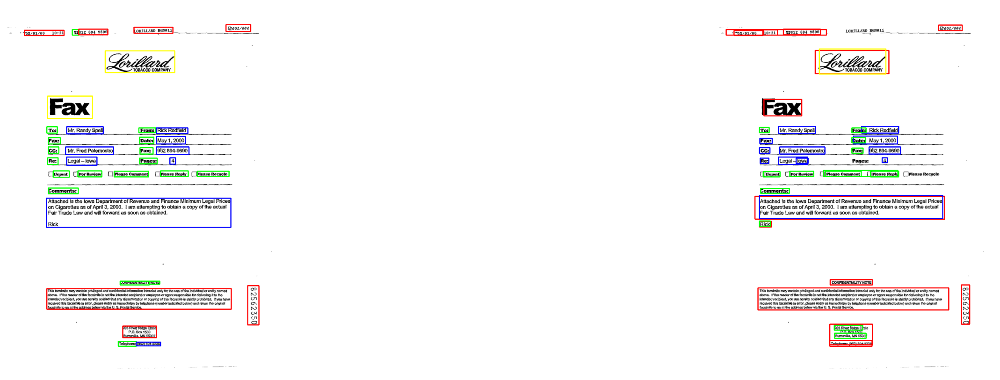

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


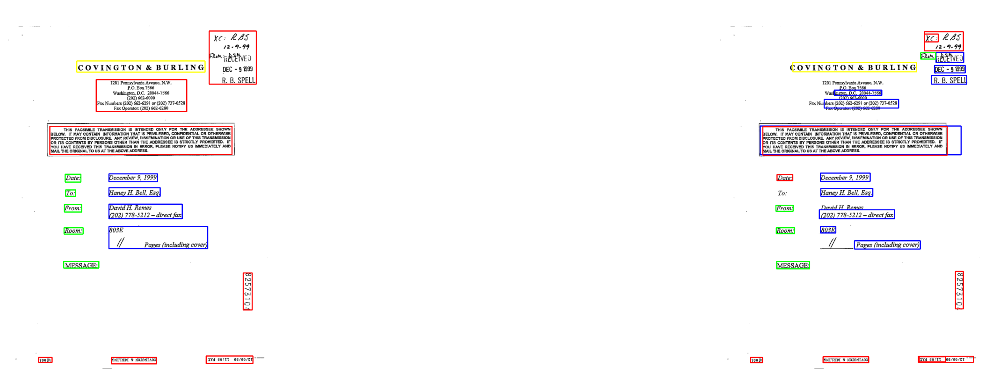

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


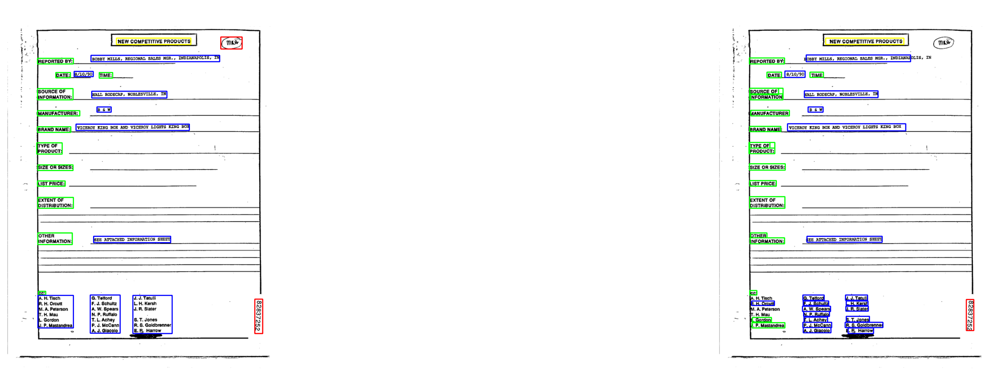

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


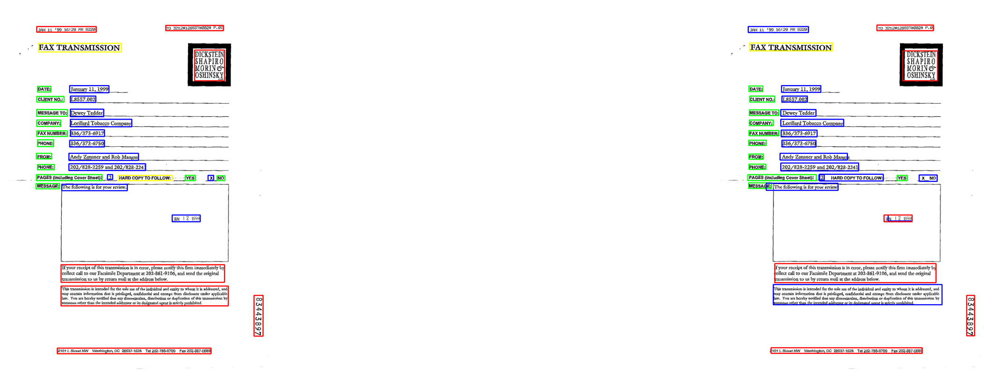

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


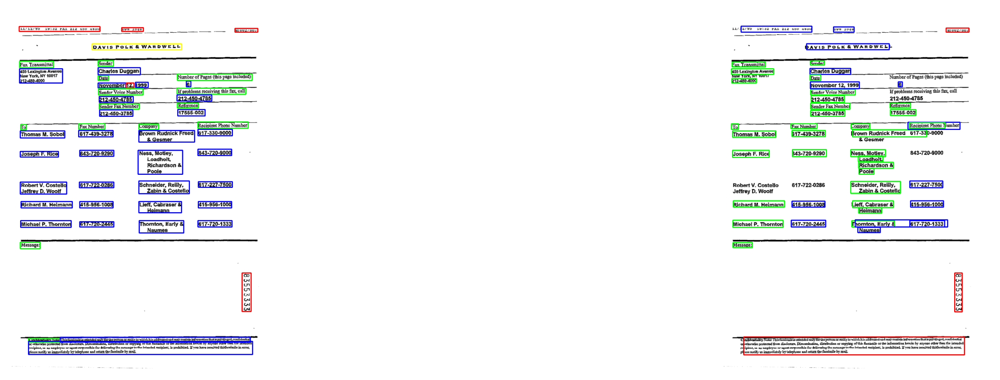

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


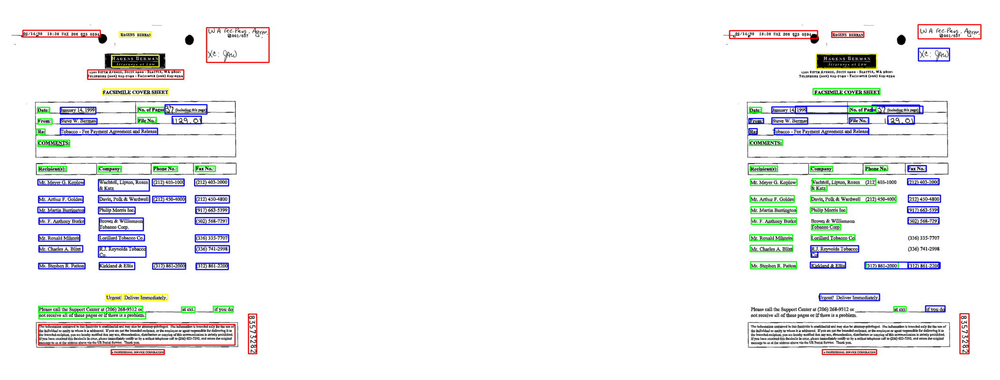

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


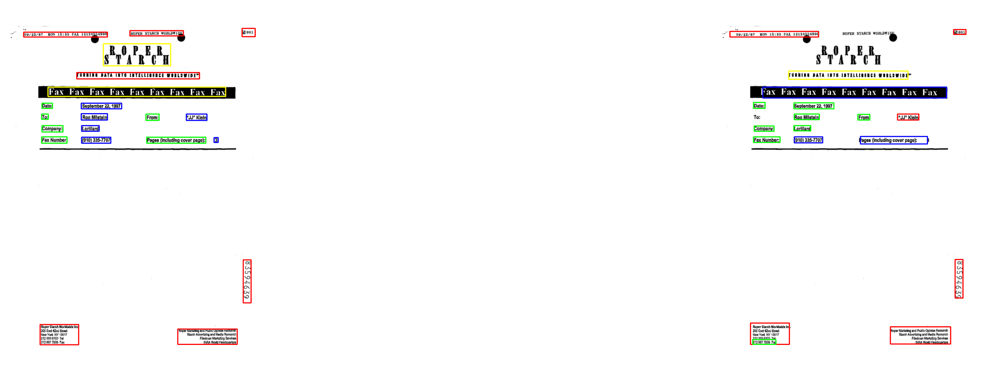

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


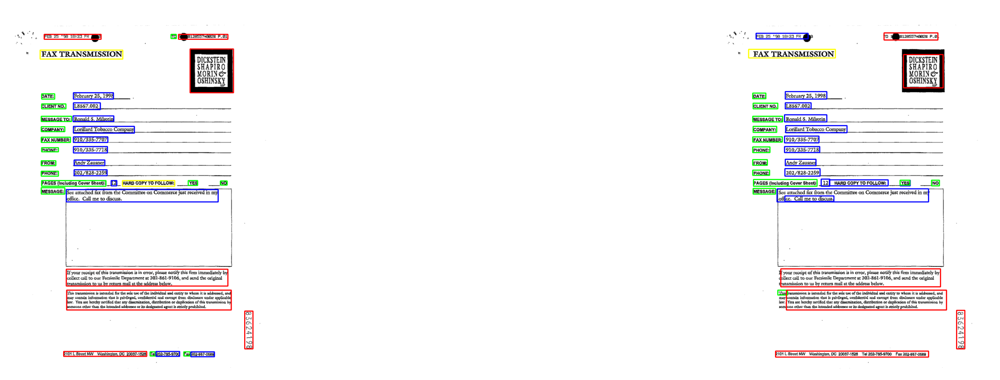

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


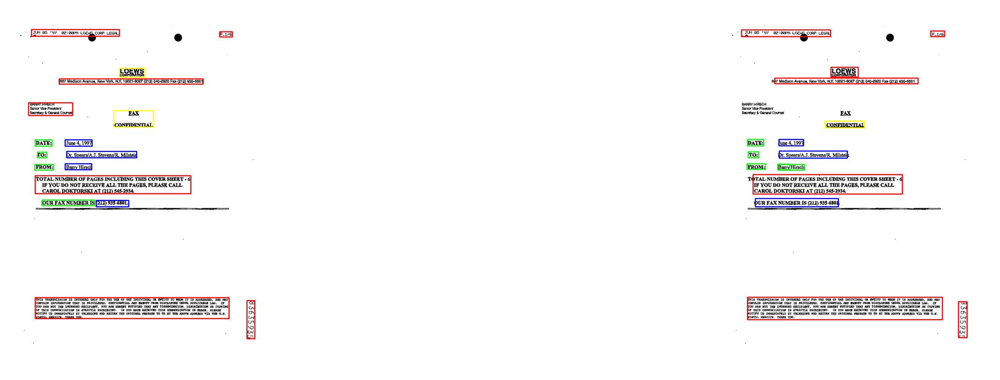

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


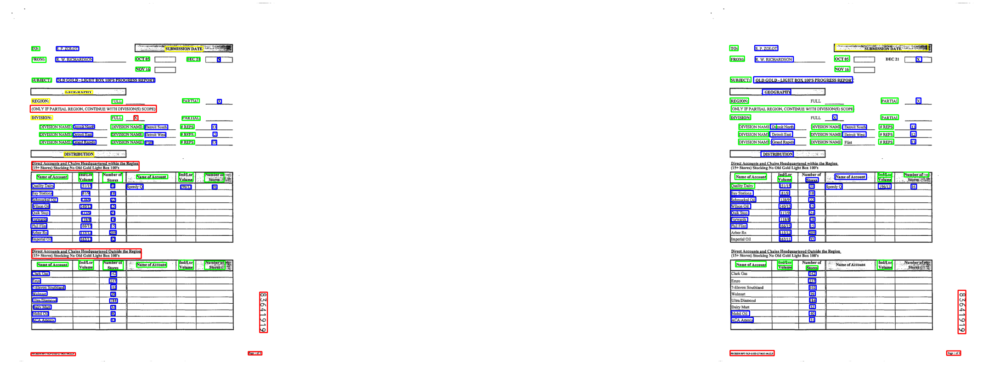

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


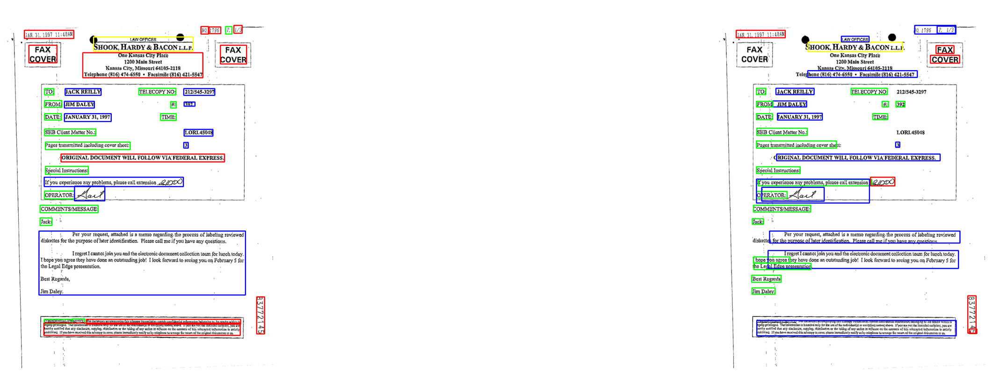

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


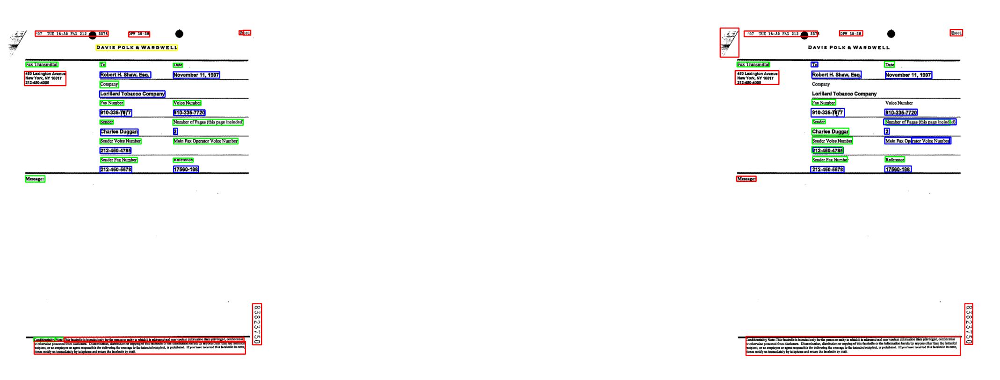

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


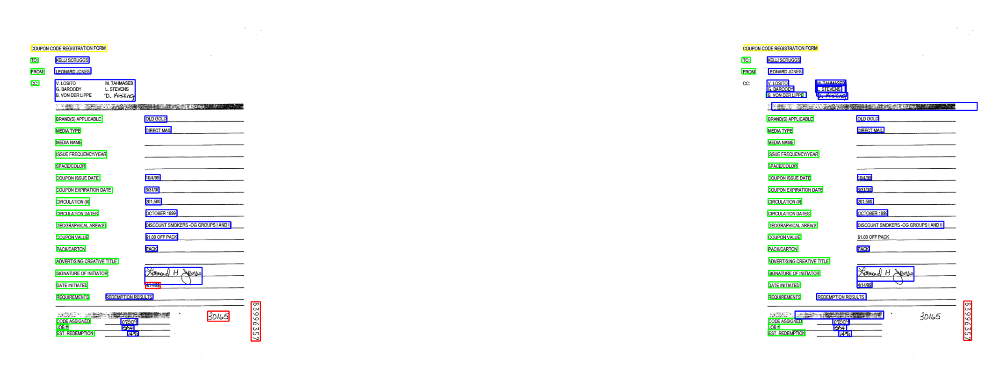

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


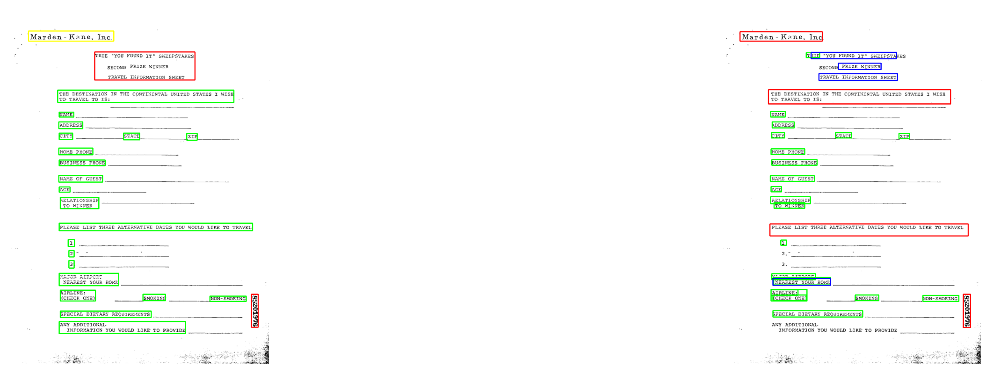

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


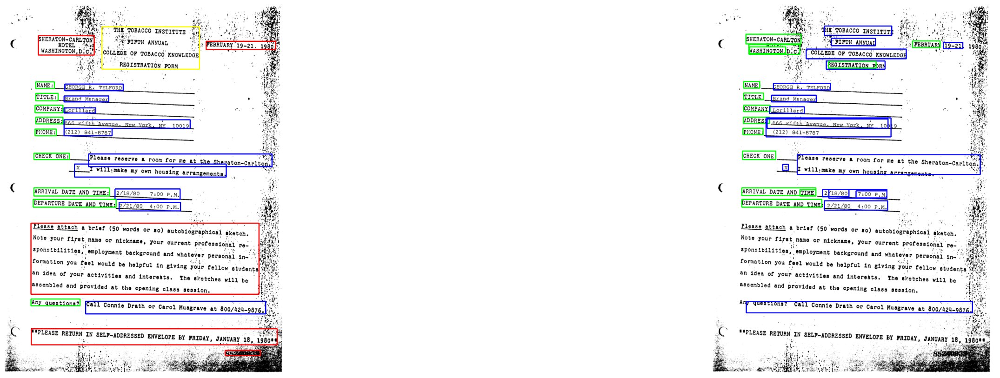

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


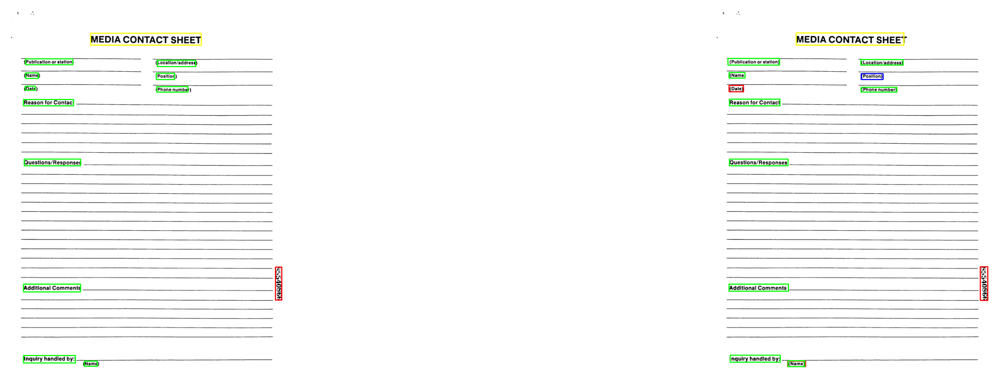

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


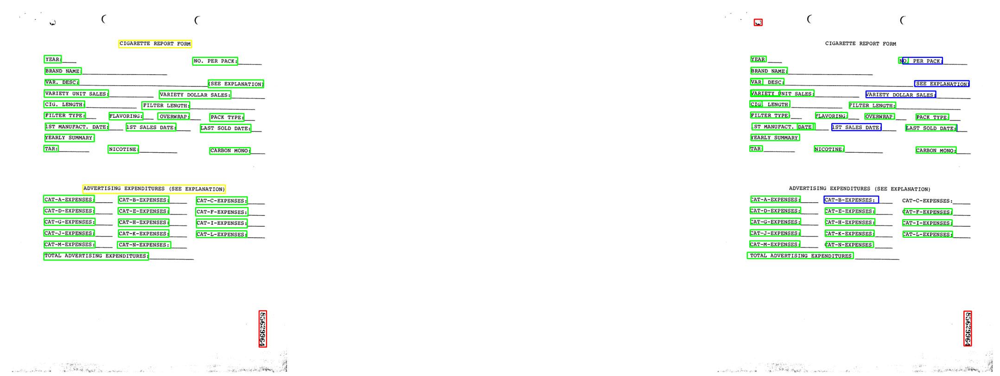

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


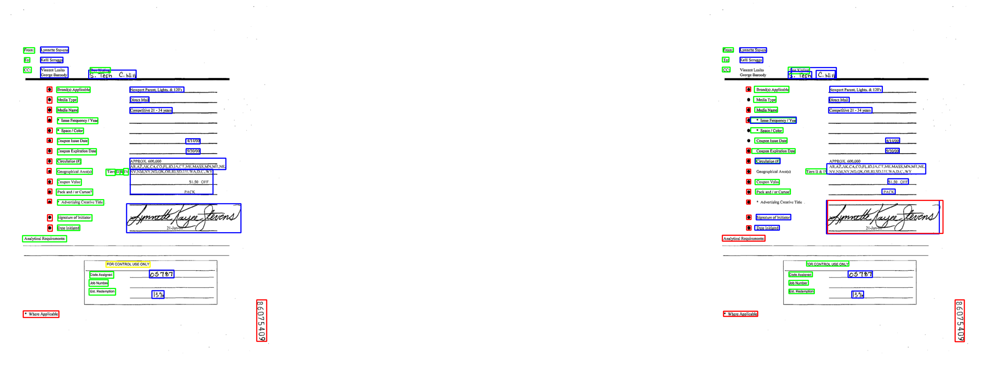

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


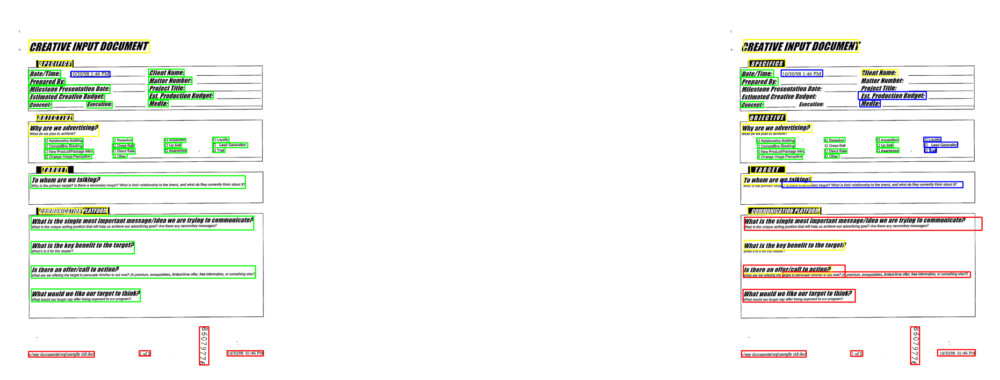

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


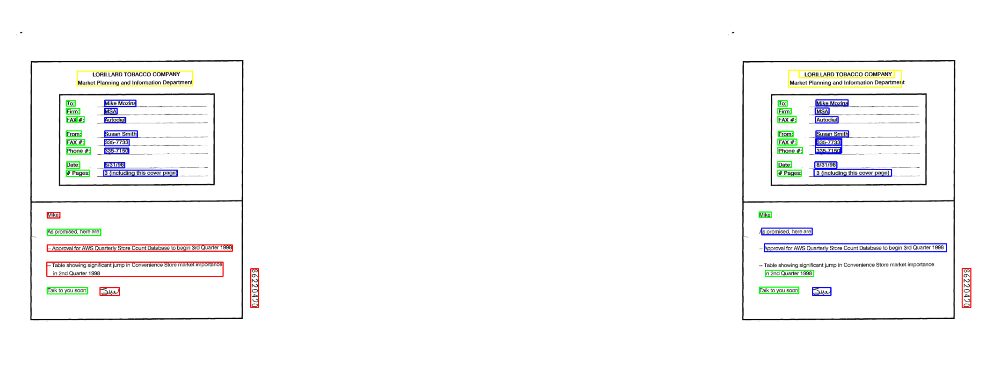

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


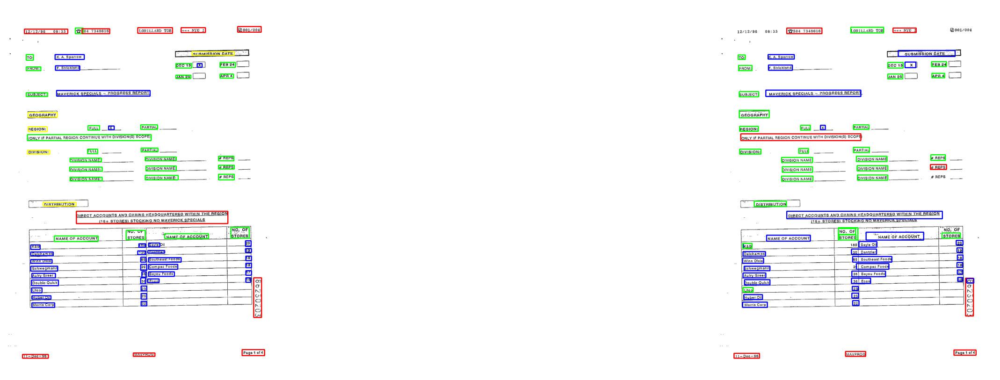

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


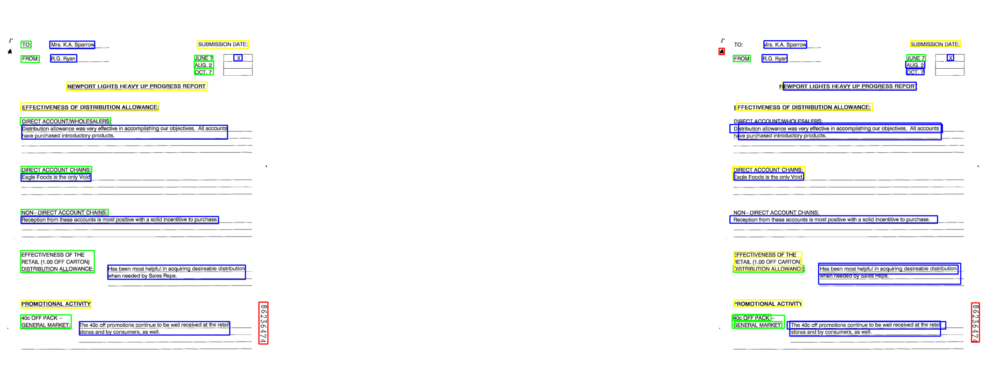

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


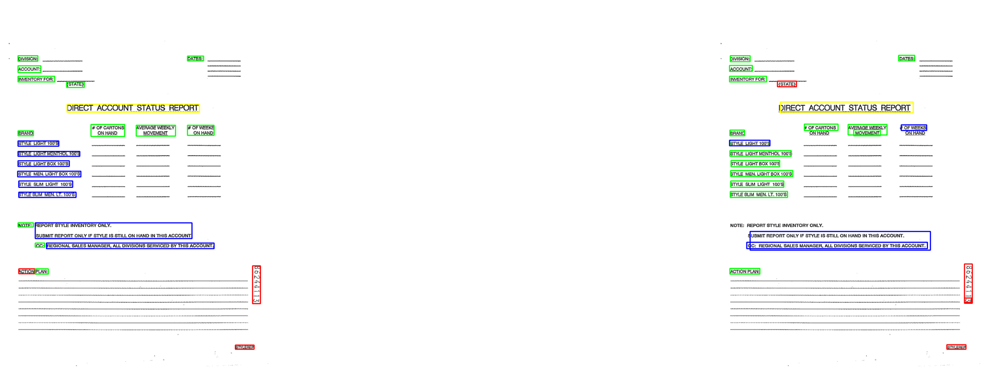

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


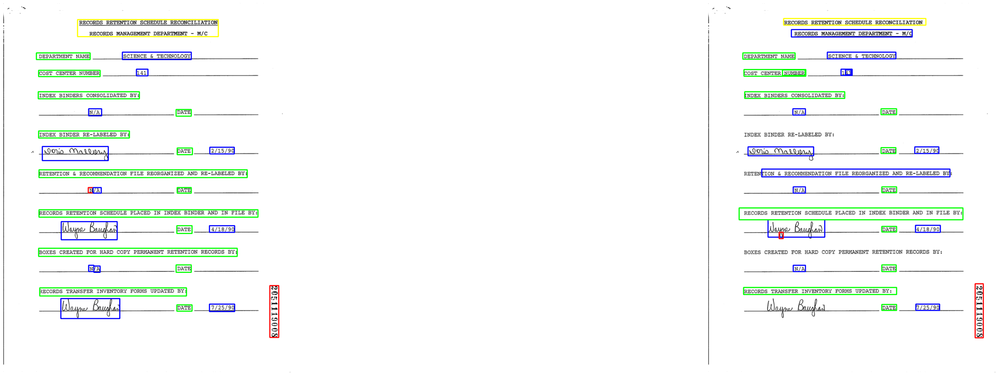

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


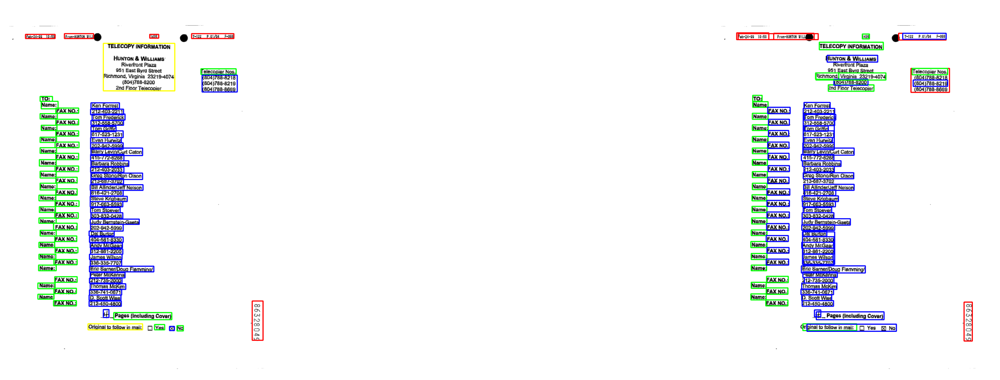

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


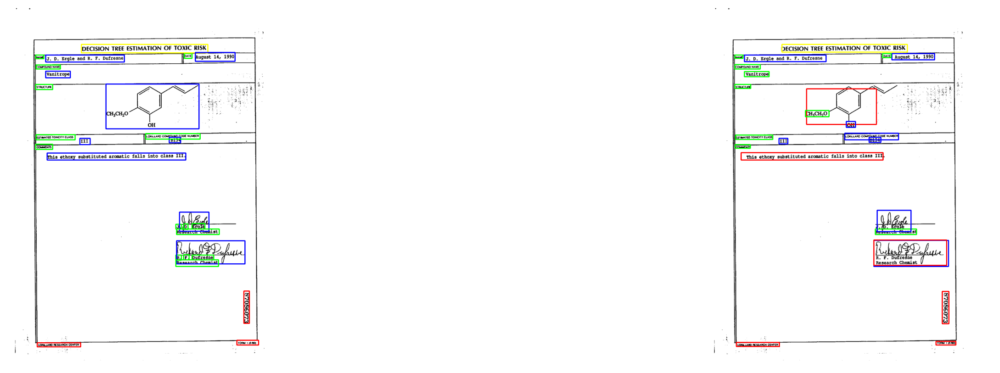

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


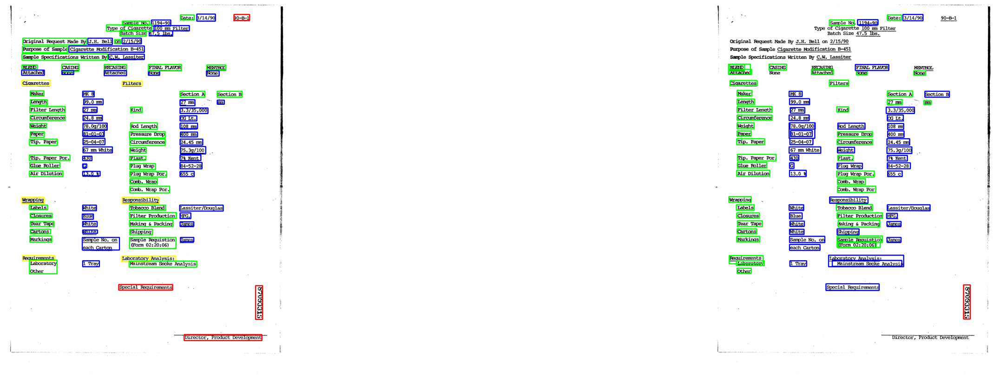

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


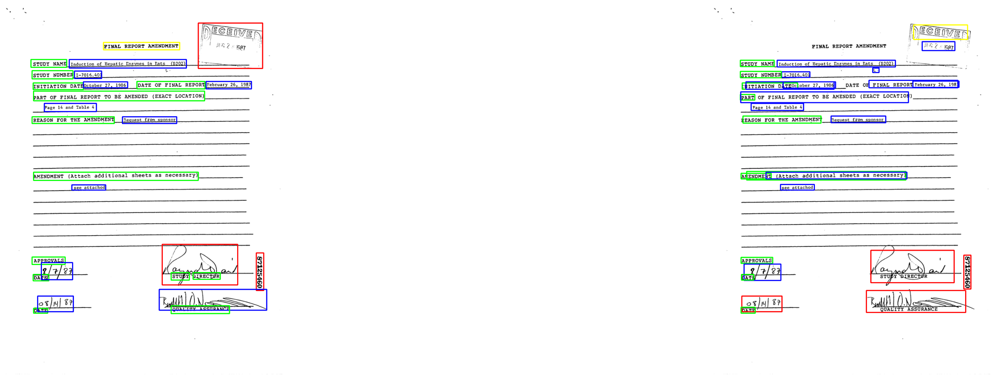

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


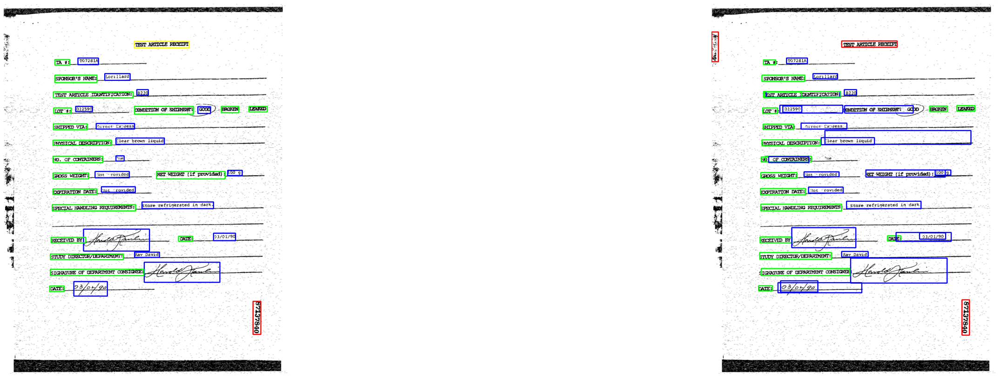

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


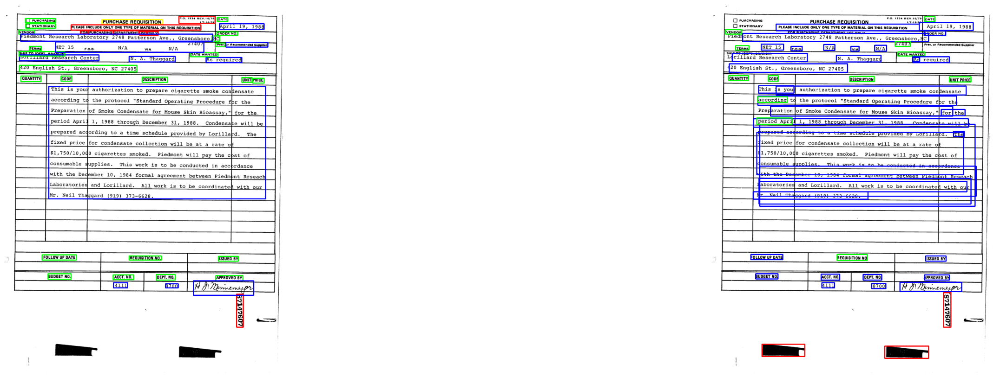

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


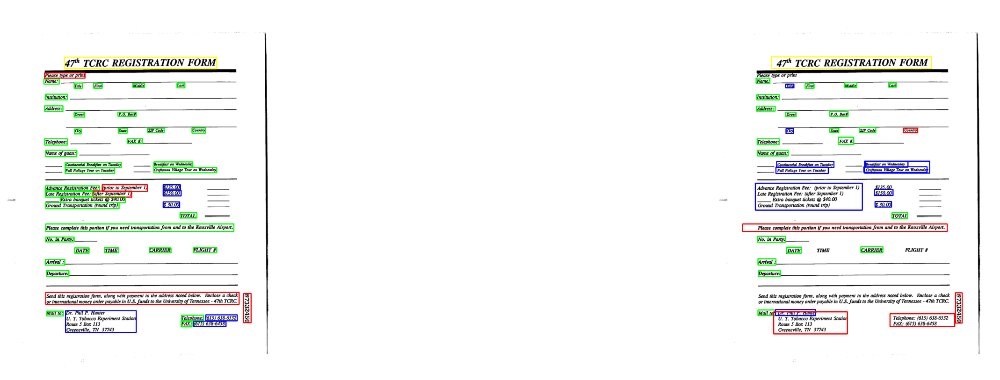

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


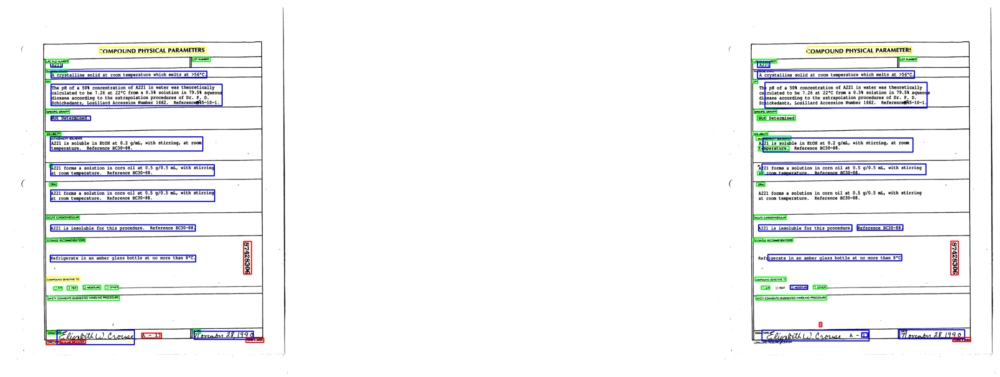

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


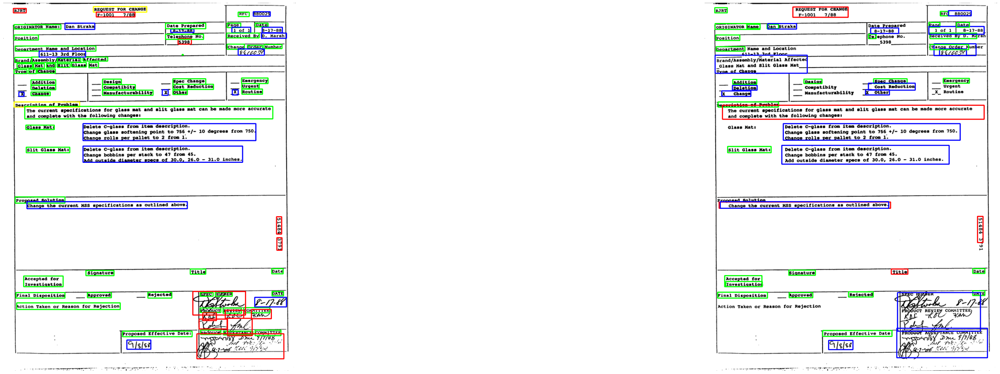

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


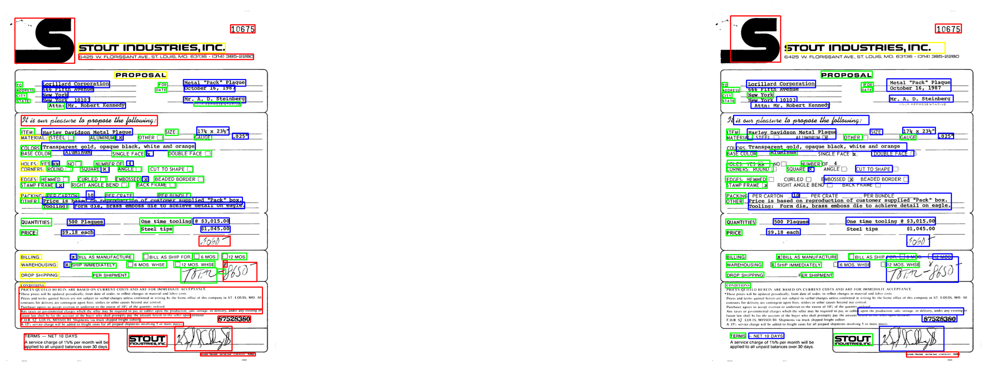

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


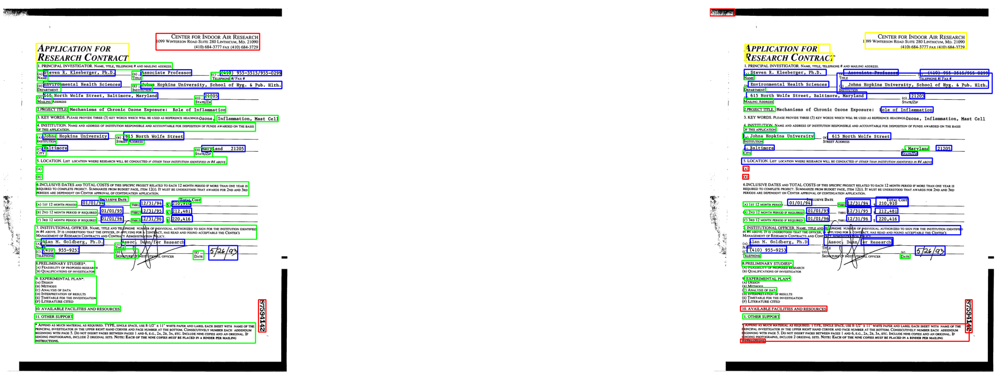

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


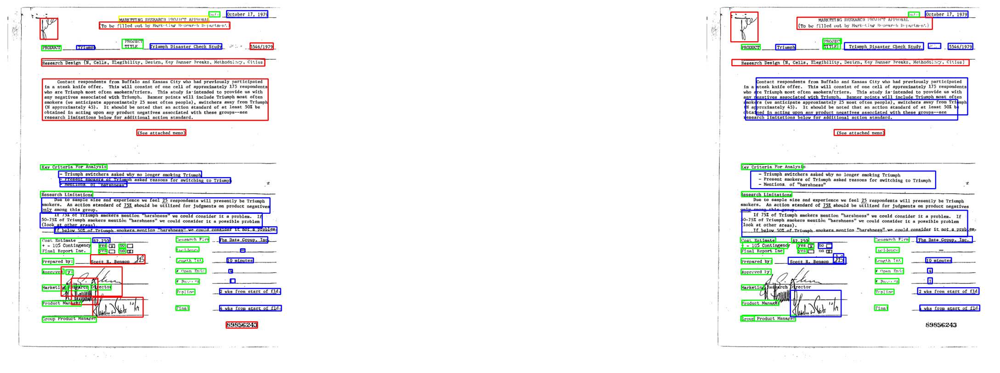

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


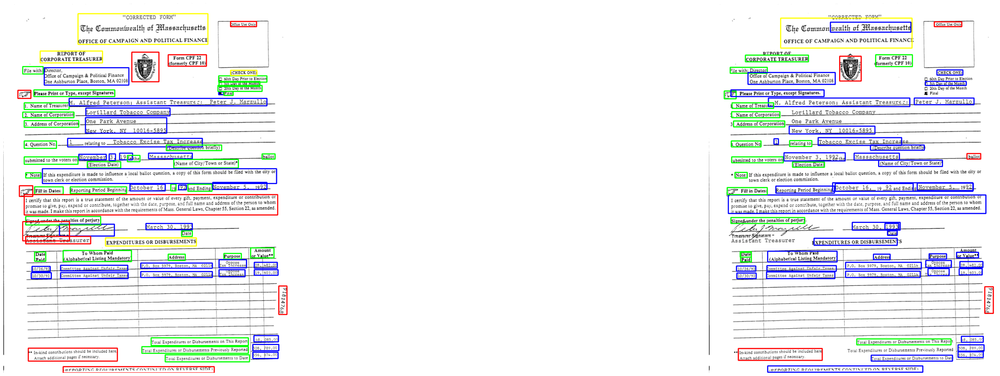

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


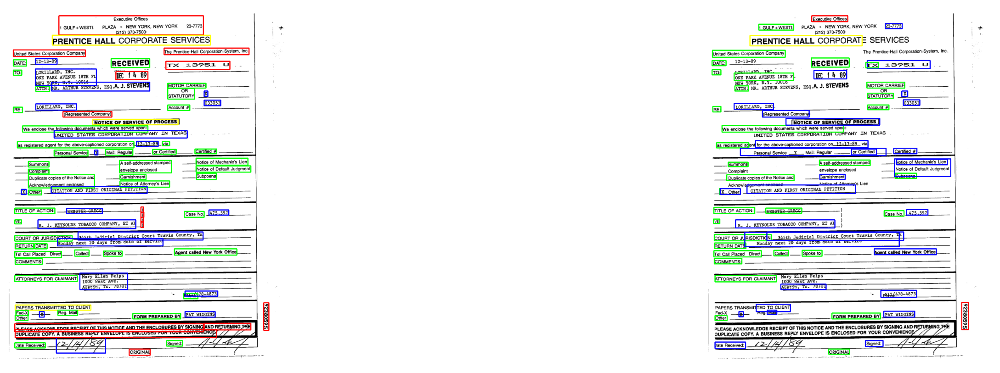

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


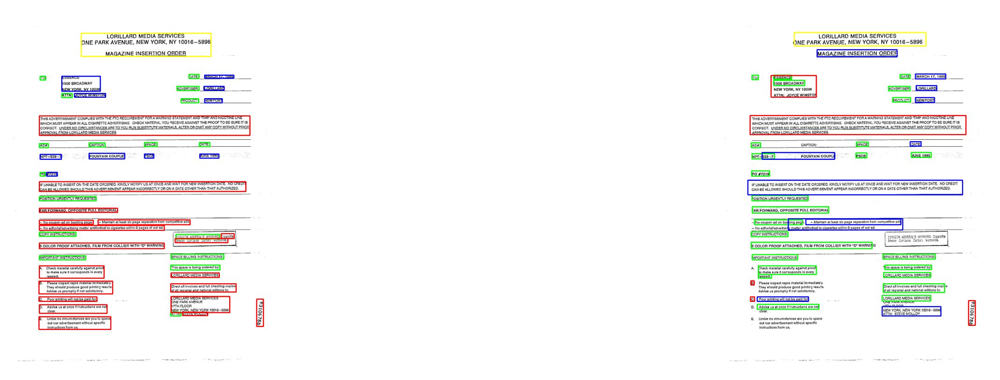

In [15]:
actualy_vs_prediction = [] #[[actual],[prediction]] actual = [boxes,labels] prediction = box, scores, labels
colors = cm.rainbow(np.linspace(0, 1, 4))
color_code = {1:(255,0,0),2:(0,255,0),3:(0,0,255),4:(255,255,0)}

for idx, (images, targets) in enumerate(valid_data_loader):
    temp = []
    plt.figure(figsize=(50,50))
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    boxes = targets[0]['boxes'].cpu().numpy().astype(np.int32)
    labels = targets[0]['labels'].cpu().numpy().astype(np.int32)
    sample = images[0].permute(1,2,0).cpu().numpy()
    temp.append([boxes,labels])
    for box,label_n in zip(boxes,labels):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),color_code[label_n],2)

    plt.subplot(3, 2, 1)
    plt.imshow(sample)
    plt.axis('off')

    cpu_device = torch.device("cpu")
    images = list(img.to(device) for img in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    boxes = targets[0]['boxes'].cpu().numpy().astype(np.int32)
    labels = targets[0]['labels'].cpu().numpy().astype(np.int32)
    sample = images[0].permute(1,2,0).cpu().numpy()

    model = model.to(device)
    model.eval()


    outputs = model(images)
    outputs = [{k: v.to(device) for k, v in t.items()} for t in outputs]
    temp.append([outputs[0]['boxes'].detach().cpu().numpy().astype(np.int32),outputs[0]['scores'].detach().cpu().numpy().astype(np.float32),outputs[0]['labels'].detach().cpu().numpy().astype(np.int32)])
    for (box, scores, label_n) in zip(temp[-1][0], temp[-1][1], temp[-1][2]):
        if scores<=0.50:
            continue
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),color_code[label_n],2)

    plt.subplot(3, 2, 2)
    plt.imshow(sample)
    plt.axis('off')
    plt.show()

    actualy_vs_prediction.append(temp)
